In [33]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from sklearn import metrics
import pandas as pd

# Decision Tree Visualization 
from sklearn.tree import export_graphviz
from subprocess import call
from IPython.display import Image

import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [34]:
#ipos = pd.read_csv('../data/clean_bloomberg.csv')
ipos = pd.read_csv('../data/clean_bloomberg_with_sectors.csv')

# Remove fairly priced ipos
#ipos = ipos[ipos['Priced Range'] != 'Priced Within Range']

In [35]:
# get labels
ipo_labels = ipos["Underpriced"].tolist()
# get features
ipos_dtyes = ipos.select_dtypes(['float64', 'float32', int])
ipo_features = ipos._get_numeric_data().columns.values.tolist()[1:-1]
print("Possible Features:", ipo_features)
# convert data types of all possible feature columns
#for ipo_feature in ipo_features:
   # ipos_dtyes[ipo_feature] = ipos[ipo_feature].astype('float32').notnull()

Possible Features: ['Profit Margin', 'Return on Assets', 'Offer Size (M)', 'Shares Outstanding (M)', 'Offer Price', 'Offer To 1st Close', 'Market Cap at Offer (M)', 'Cash Flow per Share', 'Offer Size (M).1', 'Shares Outstanding (M).1', 'Instit Owner (% Shares Out)', 'Instit Owner (Shares Held)', 'Industry Sector', 'Industry Group', 'Industry Subgroup']


In [36]:
ipo_features.remove('Offer To 1st Close')
# get columns for specified features
ipo_features = ipo_features[:-1]
ipo_features_data = ipos[ipo_features]
# split dataset to trianing set and test set
ipo_features_data_train, ipo_features_data_test, ipo_labels_train, ipo_labels_test = train_test_split(ipo_features_data, ipo_labels, test_size=0.3)
# create classifier 
clf = RandomForestClassifier(n_estimators=100)
# train the model
clf.fit(ipo_features_data_train, ipo_labels_train)
# predict
ipo_labels_pred = clf.predict(ipo_features_data_test)
# TODO save trained models

In [37]:
print("Accuracy:", metrics.accuracy_score(ipo_labels_test, ipo_labels_pred))

Accuracy: 0.7196078431372549


In [38]:
feature_imp = pd.Series(clf.feature_importances_,index=[ipo_features]).sort_values(ascending=False)
feature_imp 

Profit Margin                  0.096755
Instit Owner (% Shares Out)    0.092690
Return on Assets               0.090450
Market Cap at Offer (M)        0.086496
Cash Flow per Share            0.084114
Instit Owner (Shares Held)     0.083941
Offer Size (M).1               0.082049
Offer Size (M)                 0.078850
Shares Outstanding (M)         0.072771
Shares Outstanding (M).1       0.070989
Offer Price                    0.065311
Industry Group                 0.063409
Industry Sector                0.032175
dtype: float64

No handles with labels found to put in legend.


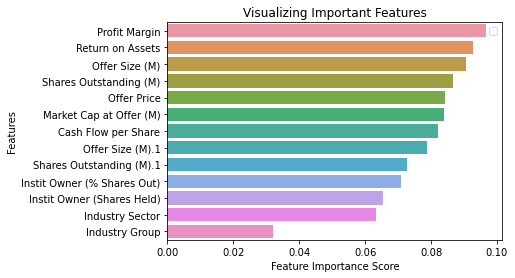

In [39]:
# Creating a bar plot
sns.barplot(x=feature_imp.values, y=ipo_features)
# Add labels to your graph
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')
plt.title("Visualizing Important Features")
plt.legend()
plt.show()

## Decision Tree Visualization

[Visualize a Decision Tree](https://towardsdatascience.com/how-to-visualize-a-decision-tree-from-a-random-forest-in-python-using-scikit-learn-38ad2d75f21c)

In [44]:
"""
estimator = clf.estimators_[10]
export_graphviz(estimator, out_file='tree.dot', 
                feature_names = ipo_features,
                class_names = True,
                rounded = True, proportion = False, 
                precision = 1, filled = True)
"""

"\nestimator = clf.estimators_[10]\nexport_graphviz(estimator, out_file='tree.dot', \n                feature_names = ipo_features,\n                class_names = True,\n                rounded = True, proportion = False, \n                precision = 1, filled = True)\n"

In [41]:
# call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.3482 to fit


0

In [42]:
# Image(filename = 'tree.png')